In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn import preprocessing
import umap
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import MiniBatchKMeans
from sklearn import metrics
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import OneHotEncoder
from kmodes.kmodes import KModes

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
ramen_df = pd.read_csv('/Users/elizabeth/Desktop/Thinkful Data Science/Capstone_unsupervised learning/ramen ratings.csv')

In [3]:
ramen_df.head()

,Review #,Brand,Variety,Style,Country,Stars,Top Ten
0,2580,New Touch,T's Restaurant Tantanmen,Cup,Japan,3.75,NaN
1,2579,Just Way,Noodles Spicy Hot Sesame Spicy Hot Sesame Guan...,Pack,Taiwan,1,NaN
2,2578,Nissin,Cup Noodles Chicken Vegetable,Cup,USA,2.25,NaN
3,2577,Wei Lih,GGE Ramen Snack Tomato Flavor,Pack,Taiwan,2.75,NaN
4,2576,Ching's Secret,Singapore Curry,Pack,India,3.75,NaN


In [4]:
ramen_df.dtypes

Review #     int64
Brand       object
Variety     object
Style       object
Country     object
Stars       object
Top Ten     object
dtype: object

In [5]:
ramen_missing = ramen_df.isnull().sum()
ramen_missing

Review #       0
Brand          0
Variety        0
Style          2
Country        0
Stars          0
Top Ten     2539
dtype: int64

In [6]:
ramen_df.Stars.unique()

array(['3.75', '1', '2.25', '2.75', '4.75', '4', '0.25', '2.5', '5',
       '4.25', '4.5', '3.5', 'Unrated', '1.5', '3.25', '2', '0', '3',
       '0.5', '4.00', '5.0', '3.50', '3.8', '4.3', '2.3', '5.00', '3.3',
       '4.0', '3.00', '1.75', '3.0', '4.50', '0.75', '1.25', '1.1', '2.1',
       '0.9', '3.1', '4.125', '3.125', '2.125', '2.9', '0.1', '2.8',
       '3.7', '3.4', '3.6', '2.85', '3.2', '3.65', '1.8'], dtype=object)

In [7]:
ramen_df[ramen_df['Stars'] == 'Unrated']

,Review #,Brand,Variety,Style,Country,Stars,Top Ten
32,2548,Ottogi,Plain Instant Noodle No Soup Included,Pack,South Korea,Unrated,NaN
122,2458,Samyang Foods,Sari Ramen,Pack,South Korea,Unrated,NaN
993,1587,Mi E-Zee,Plain Noodles,Pack,Malaysia,Unrated,NaN


In [8]:
ramen_df = ramen_df.drop(ramen_df[ramen_df['Stars']=='Unrated'].index).reset_index(drop=True)

In [9]:
ramen_df['Stars'] = ramen_df['Stars'].astype('float')

In [10]:
ramen_df['Stars'].describe()

count    2577.000000
mean        3.654676
std         1.015331
min         0.000000
25%         3.250000
50%         3.750000
75%         4.250000
max         5.000000
Name: Stars, dtype: float64

In [11]:
fig = px.histogram(ramen_df, x='Stars', nbins=20)
#fig.update_xaxes(range=[0, 6])
fig.show()

In [12]:
list(ramen_df['Style'].unique())

['Cup', 'Pack', 'Tray', 'Bowl', 'Box', 'Can', 'Bar', nan]

In [13]:
ramen_df['Style'].value_counts()

Pack    1528
Bowl     481
Cup      450
Tray     108
Box        6
Bar        1
Can        1
Name: Style, dtype: int64

In [14]:
ramen_df['Style'] = ramen_df['Style'].fillna(ramen_df['Style'].mode()[0])

In [15]:
ramen_brand = pd.DataFrame(ramen_df['Brand'].value_counts())

In [16]:
other_brand = ramen_brand[ramen_brand['Brand']<=5]
other_brand.shape

(258, 1)

In [17]:
other_brand_list = list(other_brand.index)

In [18]:
for i in other_brand_list:
    ramen_df.loc[ramen_df['Brand']==i, 'Brand'] = 'Other'

In [19]:
ramen_df['Country'].value_counts()

Japan            352
USA              323
South Korea      307
Taiwan           224
Thailand         191
China            169
Malaysia         155
Hong Kong        137
Indonesia        126
Singapore        109
Vietnam          108
UK                69
Philippines       47
Canada            41
India             31
Germany           27
Mexico            25
Australia         22
Netherlands       15
Myanmar           14
Nepal             14
Pakistan           9
Hungary            9
Bangladesh         7
Colombia           6
Cambodia           5
Brazil             5
Poland             4
Holland            4
Fiji               4
Sarawak            3
Finland            3
Dubai              3
Sweden             3
Estonia            2
Ghana              2
United States      1
Nigeria            1
Name: Country, dtype: int64

In [20]:
fig = px.histogram(ramen_df, x='Country')
fig.show()

In [21]:
fig = px.pie(ramen_df, values='Review #', names='Style')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [22]:
ramen_df['Top Ten'].value_counts()

\n          4
2016 #9     1
2014 #10    1
2014 #5     1
2015 #4     1
2013 #6     1
2015 #6     1
2012 #9     1
2016 #7     1
2015 #9     1
2012 #1     1
2012 #5     1
2015 #8     1
2012 #2     1
2012 #4     1
2016 #8     1
2014 #9     1
2016 #1     1
2012 #10    1
2013 #2     1
2014 #7     1
2013 #9     1
2014 #1     1
2014 #4     1
2012 #6     1
2016 #10    1
2015 #10    1
2012 #7     1
2013 #4     1
2014 #8     1
2015 #1     1
2013 #1     1
2014 #6     1
2015 #7     1
2016 #5     1
2013 #10    1
2012 #3     1
2013 #3     1
Name: Top Ten, dtype: int64

In [23]:
ramen_df['Top Ten'] = ramen_df['Top Ten'].fillna('N')
ramen_df.loc[ramen_df['Top Ten']!='N', 'Top Ten']="Y"

In [24]:
ramen_by_rating = ramen_df.groupby('Top Ten').agg({'Stars':['mean']})
ramen_by_rating 

,Stars
,mean
Top Ten,
N,3.634897
Y,4.878049


Label Encoding

In [25]:
le = preprocessing.LabelEncoder()

In [26]:
le.fit(ramen_df['Country'])

LabelEncoder()

In [27]:
le.classes_

array(['Australia', 'Bangladesh', 'Brazil', 'Cambodia', 'Canada', 'China',
       'Colombia', 'Dubai', 'Estonia', 'Fiji', 'Finland', 'Germany',
       'Ghana', 'Holland', 'Hong Kong', 'Hungary', 'India', 'Indonesia',
       'Japan', 'Malaysia', 'Mexico', 'Myanmar', 'Nepal', 'Netherlands',
       'Nigeria', 'Pakistan', 'Philippines', 'Poland', 'Sarawak',
       'Singapore', 'South Korea', 'Sweden', 'Taiwan', 'Thailand', 'UK',
       'USA', 'United States', 'Vietnam'], dtype=object)

In [28]:
le.transform(ramen_df['Country'])

array([18, 32, 35, ..., 33, 33, 35])

In [29]:
ramen_df['Country_Labeled'] = le.fit_transform(ramen_df['Country'].values)
ramen_df['Style_Labled'] = le.fit_transform(ramen_df['Style'].values)
ramen_df['Top Ten_Labeled'] = le.fit_transform(ramen_df['Top Ten'].values)
ramen_df['Brand_Labeled'] = le.fit_transform(ramen_df['Brand'].values)

In [30]:
ramen_df['Stars Group'] = ramen_df['Stars'].round()

In [31]:
ramen_df.head()

,Review #,Brand,Variety,Style,Country,Stars,Top Ten,Country_Labeled,Style_Labled,Top Ten_Labeled,Brand_Labeled,Stars Group
0,2580,New Touch,T's Restaurant Tantanmen,Cup,Japan,3.75,N,18,4,0,50,4.0
1,2579,Other,Noodles Spicy Hot Sesame Spicy Hot Sesame Guan...,Pack,Taiwan,1.00,N,32,5,0,53,1.0
2,2578,Nissin,Cup Noodles Chicken Vegetable,Cup,USA,2.25,N,35,4,0,51,2.0
3,2577,Wei Lih,GGE Ramen Snack Tomato Flavor,Pack,Taiwan,2.75,N,32,5,0,91,3.0
4,2576,Other,Singapore Curry,Pack,India,3.75,N,16,5,0,53,4.0


PCA

In [87]:
#X = ramen_df[['Country_Labeled', 'Style_Labled', 'Top Ten_Labeled', 'Brand_Labeled']]
X = ramen_df[['Country_Labeled', 'Style_Labled', 'Top Ten_Labeled']]
y = ramen_df['Stars Group']

In [33]:
pca = PCA(n_components=2)
pca_components = pca.fit_transform(X)

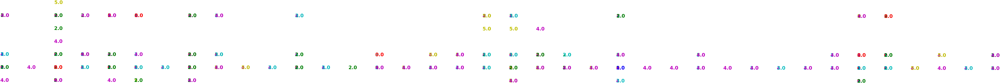

In [34]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [35]:
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 2577 samples in 0.001s...
[t-SNE] Computed neighbors for 2577 samples in 0.062s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2577
[t-SNE] Computed conditional probabilities for sample 2000 / 2577
[t-SNE] Computed conditional probabilities for sample 2577 / 2577
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 40.905815
[t-SNE] KL divergence after 300 iterations: 0.397085


In [36]:
plt.figure(figsize=(6,3))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(tsne_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [37]:
umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)

In [38]:
plt.figure(figsize=(6,3))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [88]:
kmeans_cluster = KMeans(n_clusters=5, random_state=123)

In [89]:
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

In [90]:
kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

In [42]:
labels = KMeans(n_clusters=5, random_state=123).fit_predict(X_std)
print("Adjusted Rand Index of the KMeans solution: {}"
      .format(metrics.adjusted_rand_score(y, labels)))
print("The silhoutte score of the KMeans solution: {}"
      .format(metrics.silhouette_score(X_std, labels, metric='euclidean')))

Adjusted Rand Index of the KMeans solution: 0.009702774129468695
The silhoutte score of the KMeans solution: 0.6748433203992883


TSNE

In [43]:
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X_std)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 2577 samples in 0.005s...
[t-SNE] Computed neighbors for 2577 samples in 0.093s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2577
[t-SNE] Computed conditional probabilities for sample 2000 / 2577
[t-SNE] Computed conditional probabilities for sample 2577 / 2577
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 39.949516
[t-SNE] KL divergence after 300 iterations: 0.374754


In [44]:
plt.figure(figsize=(6,3))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

DBSCAN

In [45]:
dbscan_cluster = DBSCAN(eps=2, min_samples=2)

# Fit model
clusters = dbscan_cluster.fit_predict(X_std)

plt.figure(figsize=(6,3))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [46]:
labels = DBSCAN(eps=2, min_samples=2).fit_predict(X_std)

print("Adjusted Rand Index of the DBSCAN solution: {}"
      .format(metrics.adjusted_rand_score(y, labels)))
print("The silhoutte score of the DBSCAN solution: {}"
      .format(metrics.silhouette_score(X_std, labels, metric='euclidean')))

Adjusted Rand Index of the DBSCAN solution: 0.012850004905067066
The silhoutte score of the DBSCAN solution: 0.7926040490309215


GMM

In [47]:
gmm_cluster = GaussianMixture(n_components=2, random_state=123)

clusters = gmm_cluster.fit_predict(X_std)

In [48]:
plt.figure(figsize=(6,3))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(tsne_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [49]:
labels = GaussianMixture(n_components=2, random_state=123).fit_predict(X_std)

print("Adjusted Rand Index of the GMM solution: {}"
      .format(metrics.adjusted_rand_score(y, labels)))
print("The silhoutte score of the GMM solution: {}"
      .format(metrics.silhouette_score(X_std, labels, metric='euclidean')))

Adjusted Rand Index of the GMM solution: 0.012850004905067066
The silhoutte score of the GMM solution: 0.7926040490309215


Hierarchy Clustering

In [50]:
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

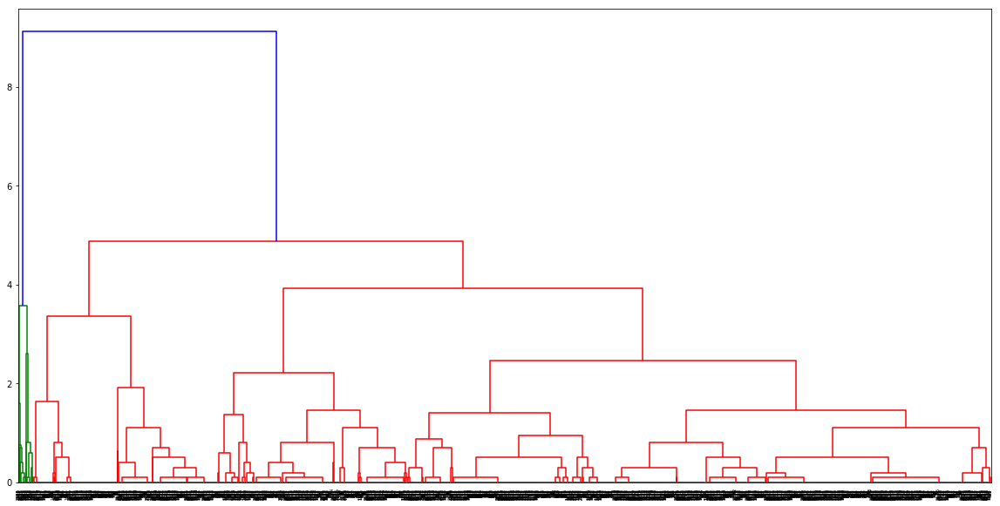

In [51]:
plt.figure(figsize=(20,10))
dendrogram(linkage(X_std, method='complete'))
plt.show()

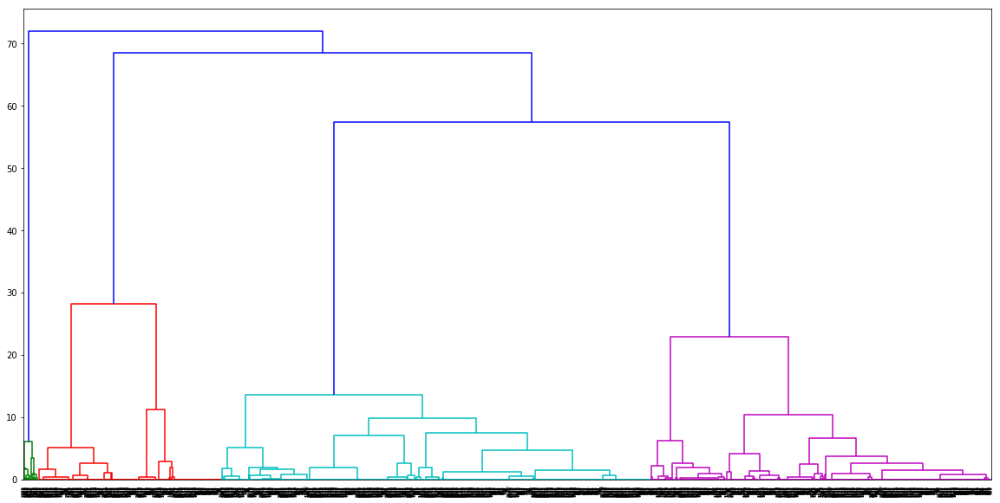

In [52]:
plt.figure(figsize=(20,10))
dendrogram(linkage(X_std, method='ward'))
plt.show()

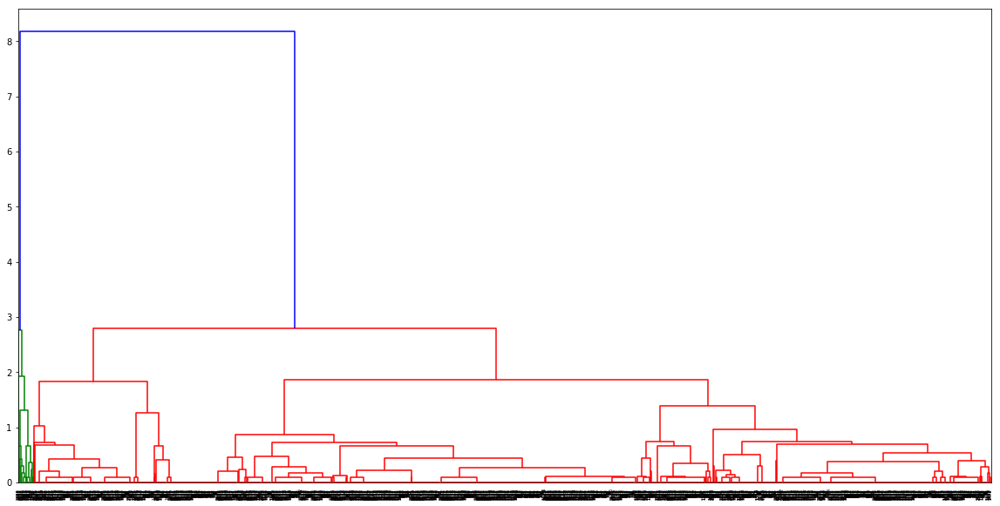

In [53]:
plt.figure(figsize=(20,10))
dendrogram(linkage(X_std, method='average'))
plt.show()

In [54]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='ward', 
                                      n_clusters=5)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

print("Adjusted Rand Index of the GMM solution: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))
print("The silhoutte score of the GMM solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

Adjusted Rand Index of the GMM solution: 0.008829849930403554
The silhoutte score of the GMM solution: 0.668734611349202


MLP

In [55]:
mlp = MLPClassifier(hidden_layer_sizes=(1000,))
mlp.fit(X, y)

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(1000,), learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=200,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=None, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)

In [56]:
print(mlp.score(X, y))
print(cross_val_score(mlp, X, y, cv=5))

0.5428793170353123
[0.53100775 0.52713178 0.54174757 0.55728155 0.54563107]


In [57]:
mlp = MLPClassifier(hidden_layer_sizes=(10,))
mlp.fit(X, y)
print(mlp.score(X, y))
print(cross_val_score(mlp, X, y, cv=5))

0.5428793170353123
[0.53100775 0.53100775 0.53203883 0.5592233  0.54563107]


In [58]:
rfr = RandomForestRegressor(random_state=123, oob_score=True)
rfr.fit(X, y)
print(cross_val_score(rfr, X, y, cv=5))
print(rfr.oob_score_)

[-0.1520955   0.08059811  0.01904385  0.02998597 -0.22498618]
0.10340900721622814


kmodes

In [94]:
km = KModes(n_clusters=5, init='random', n_init=5, verbose=1)

km_clusters = km.fit_predict(X_std)

# Print the cluster centroids
print(km.cluster_centroids_)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 477, cost: 2134.0
Run 1, iteration: 2/100, moves: 242, cost: 2134.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 94, cost: 2512.0
Run 2, iteration: 2/100, moves: 0, cost: 2512.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 371, cost: 2085.0
Run 3, iteration: 2/100, moves: 36, cost: 2085.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 233, cost: 2344.0
Run 4, iteration: 2/100, moves: 0, cost: 2344.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 144, cost: 2108.0
Run 5, iteration: 2/100, moves: 0, cost: 2108.0
Best run was number 3
[[ 1.08657737  0.56857619 -0.12715027]
 [ 0.78594285  0.56857619 -0.12715027]
 [-0.617

In [96]:
labels = KModes(n_clusters=5, random_state=123).fit_predict(X_std)
print("Adjusted Rand Index of the KModes solution: {}"
      .format(metrics.adjusted_rand_score(y, labels)))
print("The silhoutte score of the KModes solution: {}"
      .format(metrics.silhouette_score(X_std, labels, metric='euclidean')))

Adjusted Rand Index of the KModes solution: 0.015559256669947239
The silhoutte score of the KModes solution: -0.01664880520480645


https://www.kaggle.com/ashydv/bank-customer-clustering-k-modes-clustering